In [ ]:
"""
Load ROI-based lag model output and plot data.
"""

In [1]:
import pickle
import numpy as np
from scipy import stats
import matplotlib.pyplot as plt
from matplotlib.pyplot import cm
%matplotlib inline
from nilearn import datasets
from nilearn import surface
from nilearn import image as nImage
from nilearn.input_data import NiftiLabelsMasker
from nilearn import plotting

/dartfs-hpc/rc/home/z/f00589z/.conda/envs/hypeScanCentral/lib/python3.9/site-packages/nilearn/datasets/__init__.py:87: FutureWarning: Fetchers from the nilearn.datasets module will be updated in version 0.9 to return python strings instead of bytes and Pandas dataframes instead of Numpy arrays.
  warn("Fetchers from the nilearn.datasets module will be "


In [2]:
def surfaceStatMap(masker,statMapVec,avgSurface,thresh=0, conditions=['']):

    """
    :param masker:
    :param statMapVec:
    :param avgSurface:
    :param thresh:
    :param conditions: array of strings corresponding to different conditions
    :return:
    """

    # preallocate task arrays
    statMap = [[]] * len(conditions)
    texture = [[]] * len(conditions)
    view = [[]] * len(conditions)

    # for each task...
    for COND in range(len(conditions)):

        # get stat map
        statMap[COND] = masker.inverse_transform(statMapVec[COND])

        # surface plot
        texture[COND] = [[]] * 2
        view[COND] = [[]] * 2

        for HEMI in [0,1]:
            if HEMI == 0:
                texture[COND][HEMI] = surface.vol_to_surf(statMap[COND], avgSurface.pial_left)
                view[COND][HEMI] = plotting.view_surf(avgSurface.infl_left,
                                                                       texture[COND][HEMI],
                                                                       threshold=thresh,
                                                                       colorbar=True,
                                                                       title= conditions[COND] + ' left',
                                                                       bg_map=avgSurface.sulc_left)
            else:
                texture[COND][HEMI] = surface.vol_to_surf(statMap[COND], avgSurface.pial_right)
                view[COND][HEMI] = plotting.view_surf(avgSurface.infl_right,
                                                                       texture[COND][HEMI],
                                                                       threshold=thresh,
                                                                       colorbar=True,
                                                                       title=conditions[COND] + ', right',
                                                                       bg_map=avgSurface.sulc_right)

    return view

In [3]:
# set lag model output folder
dataFolder = '/dartfs-hpc/rc/lab/W/WheatleyT/f00589z/hyperscanning/storytelling/lag_model_output/ROI_datasets/'

# set file name
fileName = 'lagModel_ROIs_mode3_winTRs41_stepSize1_numSteps575_shuffRange0_perms5_maxT6_padmean_pScram.pkl'

# load model data
with open(dataFolder + fileName, 'rb') as f:
    [rngSeed, pairMap, chunkInds, pairDataByStep, groupDataByStep, pairDataAcrossSteps,
                         groupDataAcrossSteps, duration, slopeData, jVSi_slopeDiffs, groupData_slopes] = pickle.load(f)

# load ROI labels and subject list
with open('/dartfs-hpc/rc/lab/W/WheatleyT/f00589z/hyperscanning/preprocessing/ROI_datasets/ROI_labels_and_subject_order.pkl', 'rb') as f:
    [ROI_labels, subList] = pickle.load(f)

In [4]:
# groupDataByStep[COND][STEP]
print('groupDataByStep keys:')
print(groupDataByStep[0][0].keys())

# slopeData[pair/cond]
print('\nslopeData keys:')
print(slopeData[0].keys())

# groupData_slopes[COND]
print('\ngroupData_slopes keys:')
print(groupData_slopes[0].keys())

groupDataByStep keys:
dict_keys(['R_median', 'R_median_pVals', 'R_median_masks', 'R_median_pSig', 'R_mean', 'R_mean_pVals', 'R_mean_masks', 'R_mean_pSig'])

slopeData keys:
dict_keys(['Rslope', 'Rslope_perms', 'Rslope_pVals', 'Rslope_masks', 'Rslope_pSig', 'fitData'])

groupData_slopes keys:
dict_keys(['Rslope_median', 'Rslope_median_pVals', 'Rslope_median_masks', 'Rslope_median_pSig', 'Rslope_median_fitData', 'Rslope_mean', 'Rslope_mean_pVals', 'Rslope_mean_masks', 'Rslope_mean_pSig', 'Rslope_mean_fitData'])


In [5]:
# get number of steps and ROIs
numSteps = len(groupDataByStep[0])
numROIs = len(groupDataByStep[2][0]['R_median'])

# set task condition labels
conditions = ['independent','joint','joint - independent']

# prallocate condition arrays
medianR = [[]] * 3
meanR = [[]] * 3
medianSlope = [[]] * 3
meanSlope = [[]] * 3
sortInds = [[]] * 3

# get data
for COND in [0,1,2]:

    # preallocate ROI x step arrays for group means and medians
    medianR[COND] = np.empty([numROIs,numSteps])
    meanR[COND] = np.empty([numROIs,numSteps])

    # for each step...
    for STEP in range(numSteps):

        # get median and mean R^2 across subs
        medianR[COND][:,STEP] = groupDataByStep[COND][STEP]['R_median']
        meanR[COND][:,STEP] = groupDataByStep[COND][STEP]['R_median']

    # TEMPORARY - get slope values -- should be able to pull these from groupData_slopes
    medianSlope[COND] = np.empty(numROIs)
    meanSlope[COND] = np.empty(numROIs)
    for ROI in range(numROIs):
        if COND < 2:#HACK!!!!!!!!!!!!!!!!!!!!! -- need to investigate why joint-ind subtraction here is different from whats in the saved dataset
            medianSlope[COND][ROI], _, _, _, _ = stats.linregress(np.arange(numSteps),np.squeeze(medianR[COND][ROI,:]))
            meanSlope[COND][ROI], _, _, _, _ = stats.linregress(np.arange(numSteps),np.squeeze(meanR[COND][ROI,:]))
        else:
            medianSlope[COND][ROI] = medianSlope[1][ROI] - medianSlope[0][ROI]
            meanSlope[COND][ROI] = meanSlope[1][ROI] - meanSlope[0][ROI]

    # get sort indices from highest to lowest absolute slope
    sortInds[COND] = np.flip(np.argsort(np.abs(medianSlope[COND])))

    # print top topN ROIs with largest absolute slopes
    topN = 15
    print('\nTOP ' + str(topN) + ' ROIs with greatest absolute median slope (R^2/step) in the ' + conditions[COND] + ' condition:')
    for ROI in range(topN):
        print(str(ROI+1) + ') ' + ROI_labels[sortInds[COND][ROI]] + ': ' + str(np.round(medianSlope[COND][sortInds[COND][ROI]],5)))


TOP 15 ROIs with greatest absolute median slope (R^2/step) in the independent condition:
1) Left Lingual Gyrus: 0.00021
2) Right Inferior Frontal Gyrus, pars opercularis: 0.00018
3) Left Superior Temporal Gyrus, anterior division: 0.00016
4) Left Middle Temporal Gyrus, temporooccipital part: 0.00016
5) Left Paracingulate Gyrus: -0.00015
6) Left Supracalcarine Cortex: 0.00014
7) Right Paracingulate Gyrus: -0.00014
8) Left Temporal Pole: -0.00014
9) Left Lateral Occipital Cortex, superior division: -0.00014
10) Right Cuneal Cortex: 0.00014
11) Left Inferior Frontal Gyrus, pars opercularis: 0.00013
12) Right Superior Parietal Lobule: -0.00013
13) Left Middle Frontal Gyrus: -0.00013
14) Right Superior Temporal Gyrus, anterior division: 0.00013
15) Right Supracalcarine Cortex: 0.00012

TOP 15 ROIs with greatest absolute median slope (R^2/step) in the joint condition:
1) Left Cingulate Gyrus, posterior division: -0.00017
2) Left Temporal Fusiform Cortex, posterior division: -0.00016
3) Righ

In [8]:
statVec = [[]] * len(groupData_slopes)
# for COND in range(len(statVec)):
#     statVec[COND] = groupData_slopes[COND]['Rslope_median'].reshape([1,-1])
for COND in [0,1]:
    statVec[COND] = groupData_slopes[COND]['Rslope_median'].reshape([1,-1])
statVec[2] = statVec[1] - statVec[0]

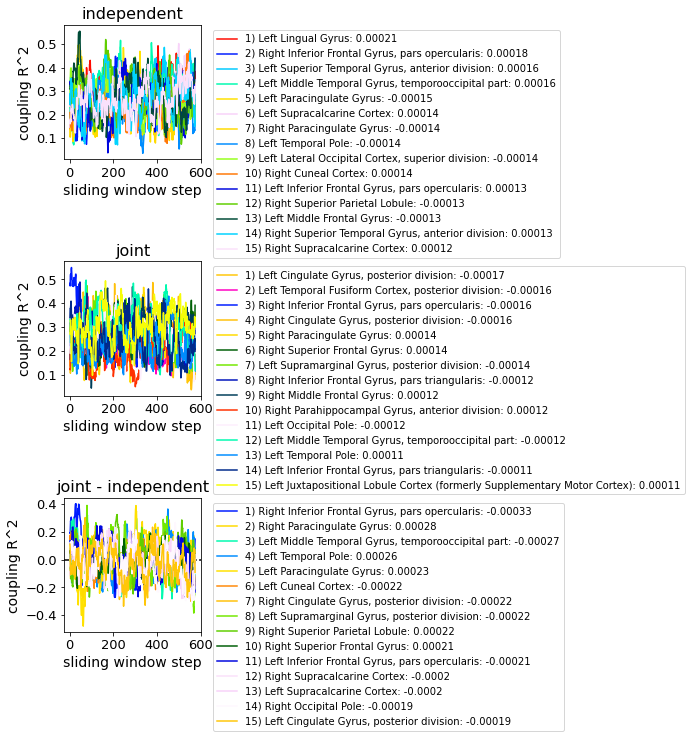

In [6]:
# initialize plot
plt.figure(facecolor='white',figsize=(10,10))

colormap = plt.cm.gist_ncar
colors = [colormap(i) for i in np.linspace(0, 1, numROIs)]

lines = [[]] * 3

axLabFontSize = 14
tickFontSize = 13
titleFontSize = 16

for COND in range(3):

    # select subplot
    plt.subplot(3, 1, COND + 1)

    # get colors
    color = iter(cm.rainbow(np.linspace(0, 1, topN)))

    if COND == 2:
        # dashed line at y=0
        plt.axhline(y = 0, color = "black", linestyle = "--")

    lines[COND] = [[]] * topN

    for ROI in range(topN):

        lines[COND][ROI], = plt.plot(np.arange(numSteps)+1, medianR[COND][sortInds[COND][ROI],:], c=colors[sortInds[COND][ROI]], label = str(ROI+1) + ') ' + ROI_labels[sortInds[COND][ROI]] + ': ' + str(np.round(medianSlope[COND][sortInds[COND][ROI]],5)))

    plt.legend(handles=lines[COND],bbox_to_anchor=(1.05, 1))

    # axis labels and title
    plt.xlabel('sliding window step', fontsize=axLabFontSize)
    plt.ylabel('coupling R^2', fontsize=axLabFontSize)
    plt.title(conditions[COND], fontsize=titleFontSize)
    plt.xticks(fontsize=tickFontSize)
    plt.yticks(fontsize=tickFontSize)

plt.tight_layout()
plt.show()

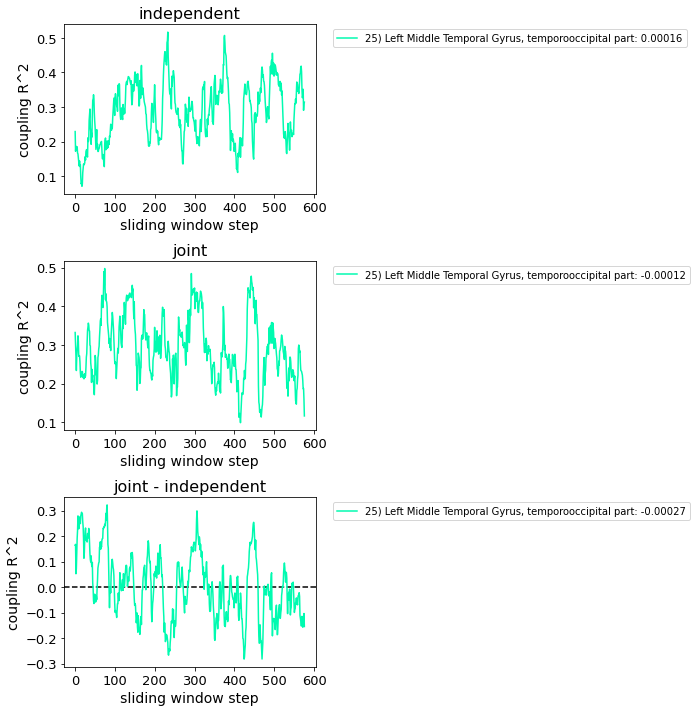

In [7]:
# initialize plot
plt.figure(facecolor='white',figsize=(10,10))

#ROI = ROI_labels.index('Left Superior Temporal Gyrus, anterior division')
ROI = ROI_labels.index('Left Middle Temporal Gyrus, temporooccipital part')

lines = [[]] * 3

for COND in range(3):

    # select subplot
    plt.subplot(3, 1, COND + 1)

    # get colors
    color = iter(cm.rainbow(np.linspace(0, 1, 1)))

    if COND == 2:
        # dashed line at y=0
        plt.axhline(y = 0, color = "black", linestyle = "--")

    # plot
    lines[COND] = plt.plot(np.arange(numSteps)+1, medianR[COND][ROI,:], c=colors[ROI], label = str(ROI+1) + ') ' + ROI_labels[ROI] + ': ' + str(np.round(medianSlope[COND][ROI],5)))

    plt.legend(handles=lines[COND],bbox_to_anchor=(1.05, 1))

    # axis labels and title
    plt.xlabel('sliding window step', fontsize=axLabFontSize)
    plt.ylabel('coupling R^2', fontsize=axLabFontSize)
    plt.title(conditions[COND], fontsize=titleFontSize)
    plt.xticks(fontsize=tickFontSize)
    plt.yticks(fontsize=tickFontSize)

plt.tight_layout()
plt.show()

In [8]:
#################################################################
### STAT MAPS ###################################################
#################################################################

In [9]:
hypDir = '/dartfs-hpc/rc/lab/W/WheatleyT/f00589z/hyperscanning/'

# Atlas file downloaded from templateflow website, already registered to the MNI152NLin2009cAsym template:
# HOCPAL = Harvard-Oxford Coortical Probabilistic Atlas Lateralized
# th25 = thresholding level for deriving a discrete version of the atlas from the probabilistic maps
# dseg = discrete segmentation
atlas_file = hypDir + 'preprocessing/tpl-MNI152NLin2009cAsym_res-02_atlas-HOCPAL_desc-th25_dseg.nii.gz'

# number of expected cortical segments in the atlas defined above:
expected_seg = 48*2  # *2 because it is lateralized

# As there is no label file distributed by templateflow with the atlas, we load the FSL-version of the atlas
# available in nilearn. The name of the atlas for nilearn.datasets.fetch_atlas_harvard_oxford() :
atlas_fsl_id = 'cort-maxprob-thr25-2mm'

# load templateflow atlas img, print some info about it
atlas = nImage.load_img(atlas_file)
print('\n\nLoaded atlas from \n' + atlas_file)
print('\nAffine is: ')
print(atlas.affine)
print('\nImage dimensions:')
print(atlas.shape)

# check the number of regions in the atlas
atlas_data = atlas.get_fdata()
# 0 is the background, don't count that as segmentation label
seg_labels = np.unique(atlas_data)
print('\nThere are ' + str(seg_labels.shape[0]-1) + ' labels (=segments) in the atlas (plus one for background)')
if expected_seg == seg_labels.shape[0]-1:
    print('We seem to be fine, expected ' + str(expected_seg) + '.')
else:
    print('PROBLEM: we expected ' + str(expected_seg) + '!')
    raise ValueError('Wrong number of labels in atlas!')

# load FSL version, get segmentation labels
# IMPORTANT: we want the lateralized version, set "symmetric_split"
fsl_atlas = datasets.fetch_atlas_harvard_oxford(atlas_fsl_id, symmetric_split=True, verbose=5)
labels = fsl_atlas['labels']
print('\n\nLoaded FSL atlas ' + atlas_fsl_id)
# check number of labels
print('\nThere are ' + str(len(labels)-1) + ' labels (=segments) in the atlas (plus one for background)')
if expected_seg == len(labels)-1:
    print('We seem to be fine, expected ' + str(expected_seg) + '.')
else:
    print('PROBLEM: we expected ' + str(expected_seg) + '!')
    raise ValueError('Wrong number of labels from FSL atlas!')



Loaded atlas from 
/dartfs-hpc/rc/lab/W/WheatleyT/f00589z/hyperscanning/preprocessing/tpl-MNI152NLin2009cAsym_res-02_atlas-HOCPAL_desc-th25_dseg.nii.gz

Affine is: 
[[   2.     0.    -0.   -96.5]
 [   0.     2.    -0.  -132.5]
 [   0.     0.     2.   -78.5]
 [   0.     0.     0.     1. ]]

Image dimensions:
(97, 115, 97)

There are 96 labels (=segments) in the atlas (plus one for background)
We seem to be fine, expected 96.
Dataset search paths: [('/dartfs-hpc/rc/home/z/f00589z/nilearn_data', False)]

Dataset found in /dartfs-hpc/rc/home/z/f00589z/nilearn_data/fsl



Loaded FSL atlas cort-maxprob-thr25-2mm

There are 96 labels (=segments) in the atlas (plus one for background)
We seem to be fine, expected 96.


In [10]:
# Define a masker object for ROI labels
# The masker would happily do signal cleaning and confound regression,
# but we only use it for signal extraction here as the data has already been preprocessed.
# Important arguments are:
# - resampling_target=data: this resamples the atlas to the data, and not the other way around
# - strategy=mean: how the masker should reduce the signals from a region to one time series
masker = NiftiLabelsMasker(labels_img=atlas,
                           background_label=0,
                           standardize=False,
                           resampling_target='data',
                           strategy='mean',
                           verbose=5)
masker.fit()

[NiftiLabelsMasker.fit] loading data from Nifti1Image('/dartfs-hpc/rc/lab/W/WheatleyT/f00589z/hyperscanning/preprocessing/tpl-MNI152NLin2009cAsym_res-02_atlas-HOCPAL_desc-th25_dseg.nii.gz')


NiftiLabelsMasker(labels_img=<nibabel.nifti1.Nifti1Image object at 0x2b93148a5d30>,
                  verbose=5)

In [11]:
fsaverage = datasets.fetch_surf_fsaverage()


In [13]:
condLabels = ['ind','joint','joint - ind']
statMap = surfaceStatMap(masker,statVec,fsaverage,0,condLabels)

[NiftiLabelsMasker.inverse_transform] computing image from signals
[NiftiLabelsMasker.inverse_transform] computing image from signals
[NiftiLabelsMasker.inverse_transform] computing image from signals


In [14]:
statMap[0][0]

In [15]:
statMap[0][1]

In [16]:
statMap[1][0]

In [17]:
statMap[1][1]

In [18]:
statMap[2][0]

In [19]:
statMap[2][1]